# AIxFuse

## Environment

In [1]:
import sys
import os
import pandas as pd
import importlib
sys.path.append('utils')
sys.setrecursionlimit(3000)
import utils_chem
importlib.reload(utils_chem)
import utils_common
importlib.reload(utils_common)
from rdkit import Chem
import numpy as np
import utils_interaction
importlib.reload(utils_interaction)
import extr_core_info
importlib.reload(extr_core_info)
import random
import warnings
import pickle
import dual_MCTS
importlib.reload(dual_MCTS)
warnings.filterwarnings('ignore')

csv_dhodh='data/inputs/active_ligands/dhodh/dhodh.csv'
dir_dhodh='data/outputs/docking/dhodh/act_pdbs_comp'
conformer_dir_dhodh='data/outputs/docking/dhodh/act_pdbs_pose'
csv_rorgt='data/inputs/active_ligands/rorgt/rorgt.csv'
dir_rorgt='data/outputs/docking/rorgt/act_pdbs_comp'
conformer_dir_rorgt='data/outputs/docking/rorgt/act_pdbs_pose'

def get_draw_mol(core_info):
    mol_list=[]
    score_list=[]
    count_list=[]
    act_mol_list=[]
    name_list=[]
    new_core_info={}
    for smiles in core_info:
        if len(core_info[smiles]['act_mols'])>=10:
            mol_list.append(Chem.MolFromSmiles(smiles))
            score_list.append(np.sum(core_info[smiles]['scores']))
            count_list.append(len(core_info[smiles]['act_mols']))
            tmp_list=[]
            print(smiles,end=',')
            for act_mol in core_info[smiles]['act_mols'][:11]:
                print(Chem.MolToSmiles(act_mol),end=',')
                tmp_list.append(Chem.MolFromSmiles(Chem.MolToSmiles(act_mol)))
            while len(tmp_list)<11:
                tmp_list.append(None)
            act_mol_list.extend(tmp_list)
            print()
            tmp_list=random.sample(core_info[smiles]['name'],min(11,len(core_info[smiles]['name'])))
            while len(tmp_list)<11:
                tmp_list.append(None)
            name_list.extend(tmp_list)
            new_core_info[smiles]=core_info[smiles]

    arg_idx=np.argsort(count_list)[::-1]
    count_list=[count_list[i] for i in arg_idx]
    mol_list=[mol_list[i] for i in arg_idx]
    temp_act_mol_list=[]
    for i in arg_idx:
        temp_act_mol_list.extend(act_mol_list[11*i:11*(i+1)])
    temp_name_list=[]
    for i in arg_idx:
        temp_name_list.extend(name_list[11*i:11*(i+1)])

    num=np.sum(np.array(count_list)>=10)
    print(sum(count_list[:num]),sum(count_list),num,len(count_list))
    print(count_list)
    final_list=[]
    for i in range(num):
        final_list.append(mol_list[i])
        final_list.extend(temp_act_mol_list[11*i:11*(i+1)])
        print(temp_name_list[11*i:11*(i+1)])
    return final_list,new_core_info
    


/home/chens/miniforge3/envs/aixfuse/lib/python3.11/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


## Get DHODH Interaction Information

In [2]:
core_info_dhodh=utils_interaction.get_infos(csv_dhodh,5773,dir_dhodh,conformer_dir_dhodh,lig_identifier='UNK:Z:900',
                                            contact_res=set([47,356]),reserved_inter=set(['hbond']),score_thrh=1,ncpu=64)
print(len(core_info_dhodh))


('297765', 16.511900156736374, (<rdkit.Chem.rdchem.Mol object at 0x7f2486b5f8b0>, 'Cc1cc(C(=O)O)c2nc[nH]c2c1', <rdkit.Chem.rdchem.Mol object at 0x7f248e81e9d0>, (<rdkit.Chem.rdchem.Mol object at 0x7f2486b5f840>,), -8.167491087293763, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 26, 27, 28}), {'hbond_47'}, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 26, 27, 28})
('51338199', 14.668072372674942, (<rdkit.Chem.rdchem.Mol object at 0x7f2486b5f220>, 'O=C1c2ccccc2C(=O)c2[nH]nnc21', <rdkit.Chem.rdchem.Mol object at 0x7f248e875ee0>, (<rdkit.Chem.rdchem.Mol object at 0x7f2486b5f300>,), -8.346787486224656, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14}), {'hbond_47'}, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14})
('51338199', 11.667650660872459, (<rdkit.Chem.rdchem.Mol object at 0x7f25b4f18890>, 'O=C1c2ccccc2C(=O)c2c1nnn2-c1cc(F)cc(F)c1', <rdkit.Chem.rdchem.Mol object at 0x7f248e8760a0>, (<rdkit.Chem.rdchem.Mol object at 0x7f2486b5f140>,), -8.346787486224656, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15,

In [3]:
final_list,core_info_dhodh=get_draw_mol(core_info_dhodh)
with open('data/temp_data/core_info_dhodh.pkl','wb') as w:
    pickle.dump(core_info_dhodh,w)

CCn1c(CO)n[nH]c1=O,CCn1c(CO)n[n:8](-[c:8]2nc(OC(C)C(F)(F)F)c3c(Oc4c(F)cccc4Cl)nncc3c2F)c1=O,CCn1c(CO)n[n:8](-[c:8]2cc3c(C(C)C)cn(-c4c(F)cccc4Cl)c(=O)c3cc2F)c1=O,C=C(c1cn(-c2ccccc2C)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12)C(F)(F)F,C=C(C)c1cn(-c2cccc(OC)c2Cl)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,C=C(C)c1cn(-c2cc(F)ccc2C)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,CCn1c(CO)n[n:8](-[c:8]2cc3c(C(C)C(F)(F)F)cn(-c4ccccc4C)c(=O)c3cc2F)c1=O,C=C(C)c1cn(-c2c(F)cccc2Cl)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,C=C(C)c1cn(-c2c(F)ccc(OC)c2Cl)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,CCn1c(CO)n[n:8](-[c:8]2cc3c(C(C)C)cn(-c4c(F)ccc(OC)c4Cl)c(=O)c3cc2F)c1=O,C=C(C)c1cn(-c2c(C)n[nH]c2Cl)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,C=C(C)c1cn(-c2cc(C)ccc2C)c(=O)c2cc(F)[c:8](-[n:8]3nc(CO)n(CC)c3=O)cc12,
COc1ccccc1,CCn1c(CO)nn(-c2cc3c(C(C)C)c[n:8](-[c:8]4ccccc4OC)c(=O)c3cc2F)c1=O,CCn1c(CO)nn(-c2nc3c(C(C)C)c[n:8](-[c:8]4ccccc4OC)c(=O)c3cc2F)c1=O,COc1c[c:5](-[n:5]2nnc3c2C(=O)c2ccccc2C

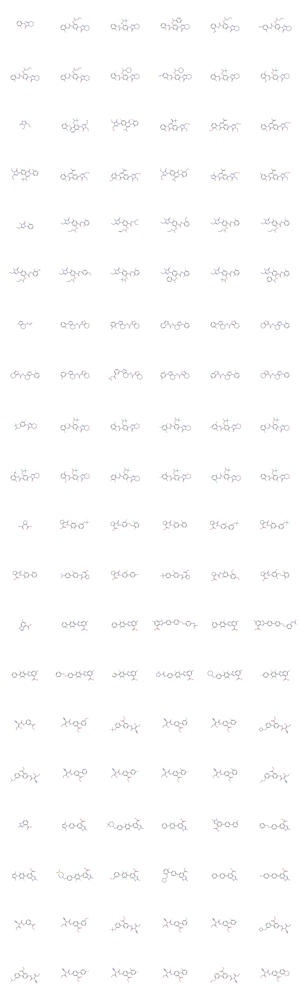

In [4]:
Chem.Draw.MolsToGridImage(final_list,molsPerRow=6,subImgSize=(600,600),maxMols=120)

## Get RORGT Interaction Information

In [5]:
core_info_rorgt=utils_interaction.get_infos(csv_rorgt,3865,dir_rorgt,conformer_dir_rorgt,lig_identifier='UNK:Z:900',
                                            contact_res=set([479]),reject_res=set([287,323,367]),reserved_inter=set(),score_thrh=1
                                            ,ncpu=64)



('669121', 9.876293882727623, (<rdkit.Chem.rdchem.Mol object at 0x7f248e909850>, 'COc1nc2ccccc2c(Cl)c1CC(F)(F)F', <rdkit.Chem.rdchem.Mol object at 0x7f248e909690>, (<rdkit.Chem.rdchem.Mol object at 0x7f25b4a06500>,), -7.958607314841775, {0, 1, 2, 3, 4, 5, 6, 7, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32}), {'hydrophobic_391'}, {0, 1, 2, 3, 4, 5, 6, 7, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32})
('669121', 7.210153630511327, (<rdkit.Chem.rdchem.Mol object at 0x7f248e909620>, 'COc1nc2ccc(CO)cc2c(Cl)c1CC(F)(F)F', <rdkit.Chem.rdchem.Mol object at 0x7f248e909cb0>, (<rdkit.Chem.rdchem.Mol object at 0x7f25b4a06650>, <rdkit.Chem.rdchem.Mol object at 0x7f248e909a80>), -7.958607314841775, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32}), {'hydrophobic_391', 'hbond_377'}, {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32})
('669121', 4.74865697324276, (<rdkit.Chem.rdchem.Mol object at 0x7f25b4a33300>, 'COc1cc(Cl)c2ccccc2n1', <rdkit.Chem.rdchem.Mol object at 0x7

In [6]:
final_list,core_info_rorgt=get_draw_mol(core_info_rorgt)
with open('data/temp_data/core_info_rorgt.pkl','wb') as w:
    pickle.dump(core_info_rorgt,w)

CC(C)(C)NS(=O)(=O)c1cccc2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCC(C)(C)C(N)=O)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NC3CC(C(=O)O)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(O)CNC(=O)c1nc(CC2CCCCC2)[c:12](-[c:12]2ccc(S(=O)(=O)NC(C)(C)C)c3ccccc32)s1,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(-c3nnc(CC(C)(C)C(=O)O)o3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)N3CC4(C3)CS(=O)(=O)C4)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCC3CS(=O)(=O)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(-c3nnc(C(C)(C)O)o3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)N3CC4(CCS(=O)(=O)CC4)C3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(=O)NCCN3CCOCC3)nc2CC2CCCCC2)c2ccccc12,CC(C)(C)NS(=O)(=O)c1cc[c:12](-[c:12]2sc(C(N)=O)nc2CC2CCCCC2)c2ccccc12,Cc1nnc(-c2nc(CC3CCCCC3)[c:12](-[c:12]3ccc(S(=O)(=O)NC(C)(C)C)c4ccccc43)s2)o1,
CCc1ccccc1,CCS(=O)(=O)c1ccc(CC(=O)Nc2cnc([O:2][CH:2](

In [7]:
Chem.Draw.MolsToGridImage(final_list,molsPerRow=6,subImgSize=(600,600),maxMols=240)

## Create Molecular Generator Agent

In [8]:
dual_MCTS_Agent=dual_MCTS.DualMCTS(core_info_rorgt,core_info_dhodh)
print(dual_MCTS_Agent.sampler1.rationale_count,dual_MCTS_Agent.sampler2.rationale_count)
with open('data/temp_data/dual_MCTS_Agent.pkl','wb') as w:
    pickle.dump(dual_MCTS_Agent,w)

158391 13225


In [2]:
# Load our original agent, check that the output is the same with the previous block!
with open('data/temp_data/rorgt_dhodh/dual_MCTS_Agent_iter_0.pkl','rb') as r:
    dual_MCTS_Agent=pickle.load(r)
print(dual_MCTS_Agent.sampler1.rationale_count,dual_MCTS_Agent.sampler2.rationale_count)


158391 13225


## Try Initial Generation

In [3]:
df=dual_MCTS_Agent.init_explore(100)
df.to_csv('tmp.csv',index=False)

 44%|████▎     | 436/1000 [00:00<00:00, 999.17it/s, generated:=100]


got mols
got sa
got qed
got weight
got logp
got tpsa
got hba
got hbd
got rotbond
